In [1]:
from dask.distributed import Client

In [2]:
client = Client(threads_per_worker=1)

In [3]:
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/8787/status,
Dashboard: /proxy/8787/status,Workers: 4
Total threads: 4,Total memory: 15.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:40001,Workers: 4
Dashboard: /proxy/8787/status,Total threads: 4
Started: Just now,Total memory: 15.00 GiB
Comm: tcp://127.0.0.1:43747,Total threads: 1
Dashboard: /proxy/44429/status,Memory: 3.75 GiB
Nanny: tcp://127.0.0.1:36285,


In [4]:
import xarray as xr
import matplotlib.pyplot as plt

In [5]:
cd /g/data/tm70/as2285/om3-scripts/expts_manager/test/900s/archive/output000

/scratch/tm70/as2285/access-om3/archive/900s-perturb-f600d568/output000


In [6]:
ls

access-om3.cice.1901-03.nc
access-om3.cice_inst.1901-03-01-00900.nc
access-om3.cice_inst.1901-03-01-01800.nc
access-om3.cice_inst.1901-03-01-02700.nc
access-om3.cice_inst.1901-03-01-03600.nc
access-om3.cice_inst.1901-03-01-04500.nc
access-om3.cice_inst.1901-03-01-05400.nc
access-om3.cice_inst.1901-03-01-06300.nc
access-om3.cice_inst.1901-03-01-07200.nc
access-om3.cice_inst.1901-03-01-08100.nc
access-om3.cice_inst.1901-03-01-09000.nc
access-om3.cice_inst.1901-03-01-09900.nc
access-om3.cice_inst.1901-03-01-10800.nc
access-om3.cice_inst.1901-03-01-11700.nc
access-om3.cice_inst.1901-03-01-12600.nc
access-om3.cice_inst.1901-03-01-13500.nc
access-om3.cice_inst.1901-03-01-14400.nc
access-om3.cice_inst.1901-03-01-15300.nc
access-om3.cice_inst.1901-03-01-16200.nc
access-om3.cice_inst.1901-03-01-17100.nc
access-om3.cice_inst.1901-03-01-18000.nc
access-om3.cice_inst.1901-03-01-18900.nc
access-om3.cice_inst.1901-03-01-19800.nc
access-om3.cice_inst.1901-03-01-20700.nc
access-om3.cice_inst.1901-03-0

In [7]:
cice_files = ! ls access-om3.cice.*.nc

In [8]:
cice_files

['access-om3.cice.1901-03.nc']

In [9]:
cice_ds = xr.open_mfdataset(cice_files)

In [10]:
cice_ds

<xarray.Dataset> Size: 16GB
Dimensions:      (time: 31, nbnd: 2, nc: 5, nkice: 4, nksnow: 1, nkbio: 3,
                  nkaer: 5, nj: 1080, ni: 1440)
Coordinates:
  * time         (time) object 248B 1901-03-01 12:00:00 ... 1901-03-31 12:00:00
Dimensions without coordinates: nbnd, nc, nkice, nksnow, nkbio, nkaer, nj, ni
Data variables: (12/51)
    time_bounds  (time, nbnd) object 496B dask.array<chunksize=(1, 2), meta=np.ndarray>
    NCAT         (nc) float64 40B dask.array<chunksize=(5,), meta=np.ndarray>
    VGRDi        (nkice) float64 32B dask.array<chunksize=(4,), meta=np.ndarray>
    VGRDs        (nksnow) float64 8B dask.array<chunksize=(1,), meta=np.ndarray>
    VGRDb        (nkbio) float64 24B dask.array<chunksize=(3,), meta=np.ndarray>
    VGRDa        (nkaer) float64 40B dask.array<chunksize=(5,), meta=np.ndarray>
    ...           ...
    strintyE     (time, nj, ni) float64 386MB dask.array<chunksize=(1, 540, 720), meta=np.ndarray>
    dvidtt       (time, nj, ni) float64 386MB dask.array<chunksize=(1, 540, 720), meta=np.ndarray>
    dvidtd       (time, nj, ni) float64 386MB dask.array<chunksize=(1, 540, 720), meta=np.ndarray>
    hisnap       (time, nj, ni) float64 386MB dask.array<chunksize=(1, 540, 720), meta=np.ndarray>
    aisnap       (time, nj, ni) float64 386MB dask.array<chunksize=(1, 540, 720), meta=np.ndarray>
    sifb         (time, nj, ni) float64 386MB dask.array<chunksize=(1, 540, 720), meta=np.ndarray>
Attributes:
    title:               access-om3
    contents:            Diagnostic and Prognostic Variables
    source:              CICE Sea Ice Model, unknown_version_name
    comment:             All years have exactly 365 days
    comment2:            File written on model date 19010302
    comment3:            seconds elapsed into model date:      0
    time_period_freq:    day_1
    time_axis_position:  middle
    conventions:         CF-1.0
    history:             Wed Nov  6 13:04:45 2024: ncrcat -O -L 5 -4 archive/...
    io_flavor:           io_pio2 hdf5
    NCO:                 netCDF Operators version 5.0.5 (Homepage = http://nc...

In [28]:
crash_point = cice_ds.isel(ni=1068,nj=1001)

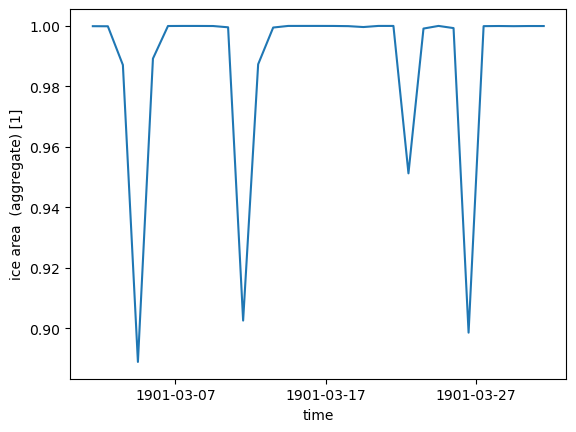

In [29]:
crash_point.aice.plot()

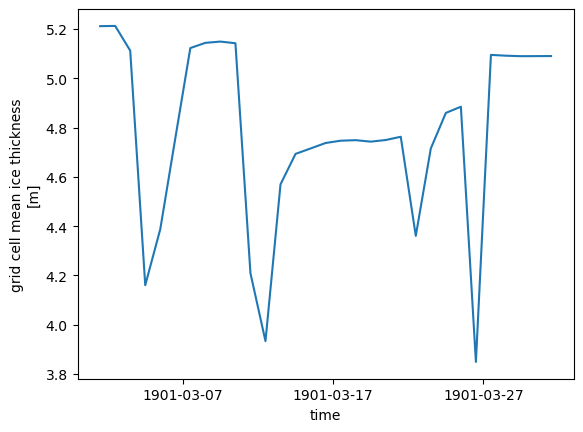

In [30]:
crash_point.hi.plot()

In [11]:
grid_ds = xr.open_dataset('/g/data/ik11/grids/ocean_grid_025.nc')

In [12]:
grid_ds

<xarray.Dataset> Size: 93MB
Dimensions:     (xt_ocean: 1440, yt_ocean: 1080, time: 1, xu_ocean: 1440,
                 yu_ocean: 1080)
Coordinates:
  * xt_ocean    (xt_ocean) float64 12kB -279.9 -279.6 -279.4 ... 79.62 79.88
  * yt_ocean    (yt_ocean) float64 9kB -81.08 -80.97 -80.87 ... 89.84 89.95
  * time        (time) object 8B 0002-01-01 00:00:00
  * xu_ocean    (xu_ocean) float64 12kB -279.8 -279.5 -279.2 ... 79.5 79.75 80.0
  * yu_ocean    (yu_ocean) float64 9kB -81.02 -80.92 -80.81 ... 89.79 89.89 90.0
    geolon_t    (yt_ocean, xt_ocean) float32 6MB ...
    geolat_t    (yt_ocean, xt_ocean) float32 6MB ...
    geolon_c    (yu_ocean, xu_ocean) float32 6MB ...
    geolat_c    (yu_ocean, xu_ocean) float32 6MB ...
Data variables:
    ht          (yt_ocean, xt_ocean) float32 6MB ...
    hu          (yu_ocean, xu_ocean) float32 6MB ...
    dxt         (yt_ocean, xt_ocean) float32 6MB ...
    dyt         (yt_ocean, xt_ocean) float32 6MB ...
    dxu         (yu_ocean, xu_ocean) float32 6MB ...
    dyu         (yu_ocean, xu_ocean) float32 6MB ...
    area_t      (yt_ocean, xt_ocean) float32 6MB ...
    area_u      (yu_ocean, xu_ocean) float32 6MB ...
    kmt         (yt_ocean, xt_ocean) float32 6MB ...
    kmu         (yu_ocean, xu_ocean) float32 6MB ...
    drag_coeff  (time, yu_ocean, xu_ocean) float32 6MB ...
Attributes:
    filename:   ocean_grid.nc
    title:      MOM5
    grid_type:  mosaic
    grid_tile:  1

In [13]:
grid_ds=grid_ds.rename({'xt_ocean':'ni', 'yt_ocean':'nj'})

In [14]:
cice_ds['TLON']=grid_ds['geolon_t']

In [15]:
cice_ds['TLAT']=grid_ds['geolat_t']

In [16]:
cice_ds

<xarray.Dataset> Size: 16GB
Dimensions:      (time: 31, nbnd: 2, nc: 5, nkice: 4, nksnow: 1, nkbio: 3,
                  nkaer: 5, nj: 1080, ni: 1440)
Coordinates:
  * time         (time) object 248B 1901-03-01 12:00:00 ... 1901-03-31 12:00:00
  * ni           (ni) float64 12kB -279.9 -279.6 -279.4 ... 79.38 79.62 79.88
  * nj           (nj) float64 9kB -81.08 -80.97 -80.87 ... 89.74 89.84 89.95
    geolon_t     (nj, ni) float32 6MB ...
    geolat_t     (nj, ni) float32 6MB ...
Dimensions without coordinates: nbnd, nc, nkice, nksnow, nkbio, nkaer
Data variables: (12/53)
    time_bounds  (time, nbnd) object 496B dask.array<chunksize=(1, 2), meta=np.ndarray>
    NCAT         (nc) float64 40B dask.array<chunksize=(5,), meta=np.ndarray>
    VGRDi        (nkice) float64 32B dask.array<chunksize=(4,), meta=np.ndarray>
    VGRDs        (nksnow) float64 8B dask.array<chunksize=(1,), meta=np.ndarray>
    VGRDb        (nkbio) float64 24B dask.array<chunksize=(3,), meta=np.ndarray>
    VGRDa        (nkaer) float64 40B dask.array<chunksize=(5,), meta=np.ndarray>
    ...           ...
    dvidtd       (time, nj, ni) float64 386MB dask.array<chunksize=(1, 540, 720), meta=np.ndarray>
    hisnap       (time, nj, ni) float64 386MB dask.array<chunksize=(1, 540, 720), meta=np.ndarray>
    aisnap       (time, nj, ni) float64 386MB dask.array<chunksize=(1, 540, 720), meta=np.ndarray>
    sifb         (time, nj, ni) float64 386MB dask.array<chunksize=(1, 540, 720), meta=np.ndarray>
    TLON         (nj, ni) float32 6MB ...
    TLAT         (nj, ni) float32 6MB ...
Attributes:
    title:               access-om3
    contents:            Diagnostic and Prognostic Variables
    source:              CICE Sea Ice Model, unknown_version_name
    comment:             All years have exactly 365 days
    comment2:            File written on model date 19010302
    comment3:            seconds elapsed into model date:      0
    time_period_freq:    day_1
    time_axis_position:  middle
    conventions:         CF-1.0
    history:             Wed Nov  6 13:04:45 2024: ncrcat -O -L 5 -4 archive/...
    io_flavor:           io_pio2 hdf5
    NCO:                 netCDF Operators version 5.0.5 (Homepage = http://nc...

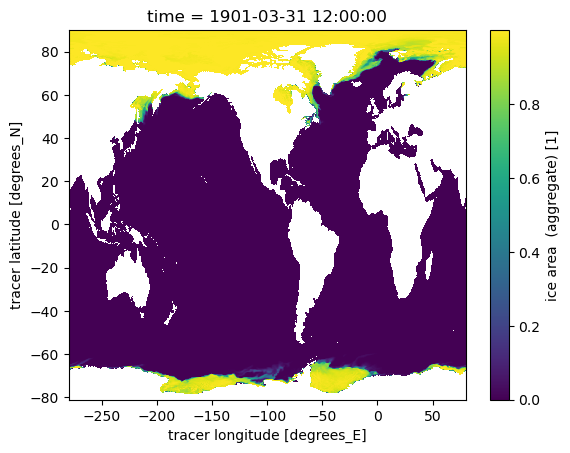

In [37]:
ax = plt.subplot()

cice_ds.aice.isel(time=-1).plot(ax=ax, x = 'geolon_t' , y = 'geolat_t' )

ax.add_patch(plt.Rectangle((1064,996),width=10, height=10, color='red', fill=None))

plt.show()

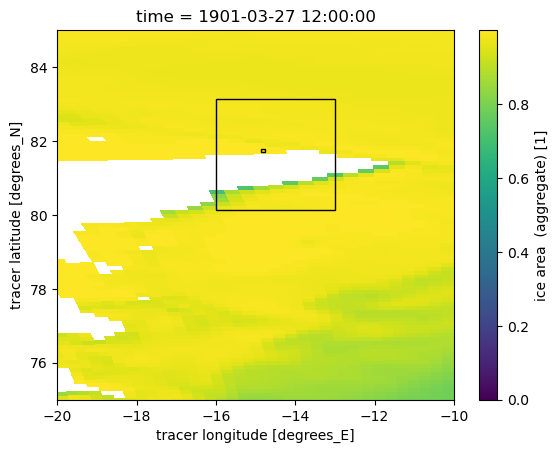

In [18]:
plt.figure()
ax = plt.subplot()

cice_ds.aice.isel(time=26).plot(ax=ax, x = 'geolon_t' , y = 'geolat_t')
plt.ylim([75,85])
plt.xlim([-20,-10])

ax.add_patch(plt.Rectangle((-16,80.125),width=3, height=3, color='black', fill=None))
ax.add_patch(plt.Rectangle((-14.8643879243489,81.6865092532964),width=0.1, height=0.1, color='black', fill=None))


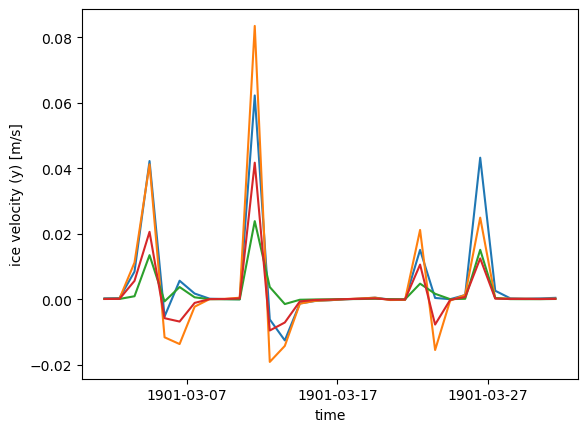

In [39]:
for v in ['uvel','vvel', 'uvelE', 'vvelE']:
    crash_point[v].plot()

# And with the inst output

In [20]:
inst_files = ! ls access-om3.cice_inst.1901-03-*.nc

In [21]:
inst_files

['access-om3.cice_inst.1901-03-01-00900.nc',
 'access-om3.cice_inst.1901-03-01-01800.nc',
 'access-om3.cice_inst.1901-03-01-02700.nc',
 'access-om3.cice_inst.1901-03-01-03600.nc',
 'access-om3.cice_inst.1901-03-01-04500.nc',
 'access-om3.cice_inst.1901-03-01-05400.nc',
 'access-om3.cice_inst.1901-03-01-06300.nc',
 'access-om3.cice_inst.1901-03-01-07200.nc',
 'access-om3.cice_inst.1901-03-01-08100.nc',
 'access-om3.cice_inst.1901-03-01-09000.nc',
 'access-om3.cice_inst.1901-03-01-09900.nc',
 'access-om3.cice_inst.1901-03-01-10800.nc',
 'access-om3.cice_inst.1901-03-01-11700.nc',
 'access-om3.cice_inst.1901-03-01-12600.nc',
 'access-om3.cice_inst.1901-03-01-13500.nc',
 'access-om3.cice_inst.1901-03-01-14400.nc',
 'access-om3.cice_inst.1901-03-01-15300.nc',
 'access-om3.cice_inst.1901-03-01-16200.nc',
 'access-om3.cice_inst.1901-03-01-17100.nc',
 'access-om3.cice_inst.1901-03-01-18000.nc',
 'access-om3.cice_inst.1901-03-01-18900.nc',
 'access-om3.cice_inst.1901-03-01-19800.nc',
 'access-o

In [22]:
inst_ds = xr.open_mfdataset(inst_files)

In [23]:
inst_ds['TLON']=grid_ds['geolon_t']

In [24]:
inst_ds['TLAT']=grid_ds['geolat_t']

In [25]:
crash_point = inst_ds.isel(ni=1068,nj=1001)

In [26]:
crash_point

<xarray.Dataset> Size: 881kB
Dimensions:      (time: 2975, nbnd: 2, nkice: 4, nksnow: 1, nkbio: 3, nkaer: 5,
                  nc: 5)
Coordinates:
  * time         (time) object 24kB 1901-03-01 00:07:28.242188 ... 1901-03-31...
    NCAT         (nc) float64 40B dask.array<chunksize=(5,), meta=np.ndarray>
    ni           float64 8B -12.88
    nj           float64 8B 81.71
    geolon_t     float32 4B ...
    geolat_t     float32 4B ...
Dimensions without coordinates: nbnd, nkice, nksnow, nkbio, nkaer, nc
Data variables: (12/24)
    time_bounds  (time, nbnd) object 48kB dask.array<chunksize=(1, 2), meta=np.ndarray>
    VGRDi        (time, nkice) float64 95kB dask.array<chunksize=(1, 4), meta=np.ndarray>
    VGRDs        (time, nksnow) float64 24kB dask.array<chunksize=(1, 1), meta=np.ndarray>
    VGRDb        (time, nkbio) float64 71kB dask.array<chunksize=(1, 3), meta=np.ndarray>
    VGRDa        (time, nkaer) float64 119kB dask.array<chunksize=(1, 5), meta=np.ndarray>
    blkmask      (time) float64 24kB dask.array<chunksize=(1,), meta=np.ndarray>
    ...           ...
    frazil_1     (time) float64 24kB dask.array<chunksize=(1,), meta=np.ndarray>
    dvidtt_1     (time) float64 24kB dask.array<chunksize=(1,), meta=np.ndarray>
    dvidtd_1     (time) float64 24kB dask.array<chunksize=(1,), meta=np.ndarray>
    aicen_1      (time, nc) float64 119kB dask.array<chunksize=(1, 2), meta=np.ndarray>
    TLON         float32 4B ...
    TLAT         float32 4B ...
Attributes:
    title:               access-om3
    contents:            Diagnostic and Prognostic Variables
    source:              CICE Sea Ice Model, unknown_version_name
    comment:             All years have exactly 365 days
    comment2:            File written on model date 19010301
    comment3:            seconds elapsed into model date:    900
    time_period_freq:    step_1
    time_axis_position:  middle
    conventions:         CF-1.0
    history:             This dataset was created on 2024-11-06 at 10:51
    io_flavor:           io_pio2 hdf5

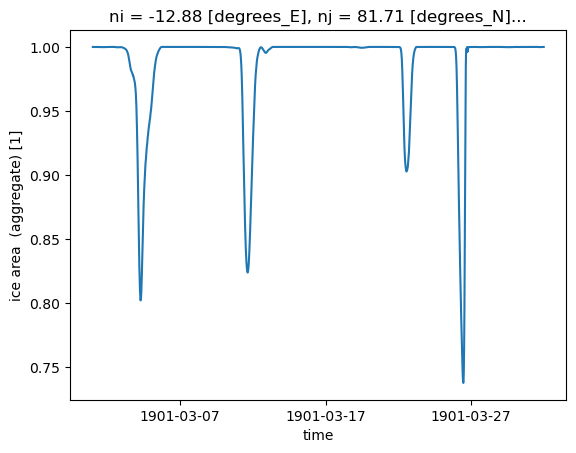

In [27]:
crash_point.aice_1.plot()

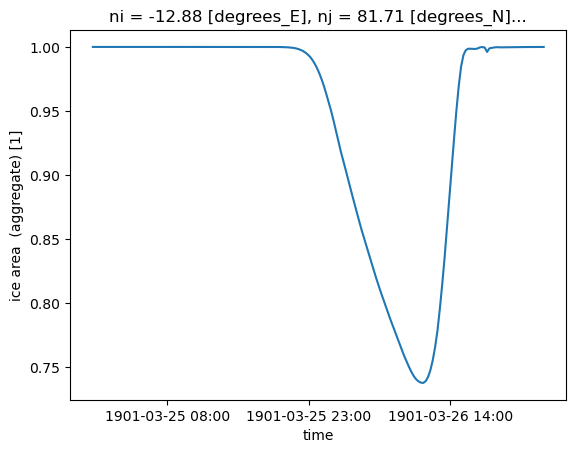

In [29]:
crash_point.sel(time=slice('1901-03-25','1901-03-26')).aice_1.plot()

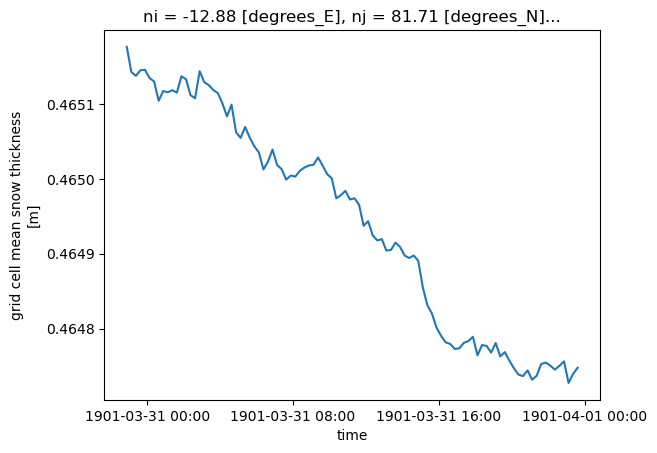

In [49]:
crash_point.isel(time=slice(-100,None)).hs_1.plot()

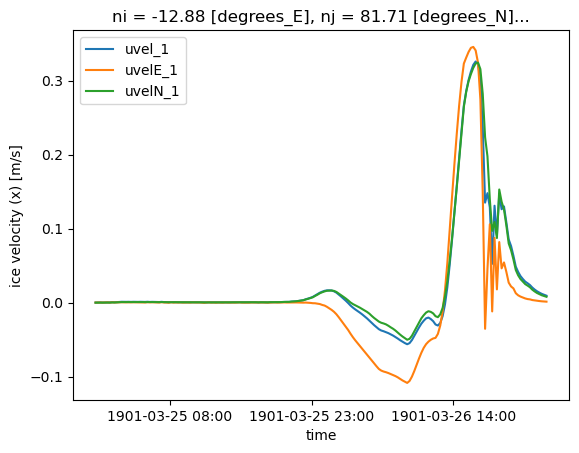

In [30]:
for v in ['uvel_1',#'vvel_1', 
          'uvelE_1', #'vvelE_1', 
          'uvelN_1', #'vvelN_1'
         ]:
    crash_point[v].sel(time=slice('1901-03-26','1901-03-26')).plot(label=v)

plt.legend()

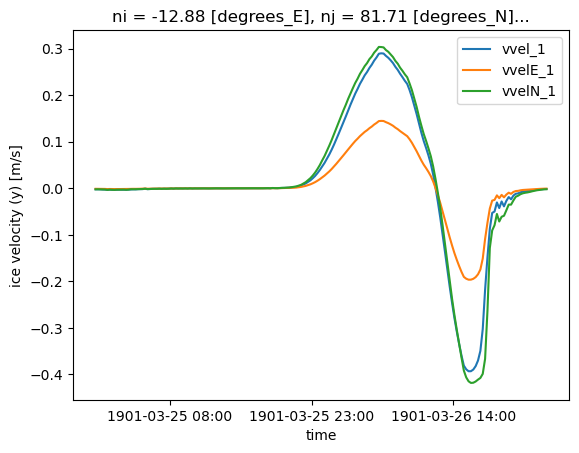

In [32]:
for v in ['vvel_1', 
          'vvelE_1', 
          'vvelN_1'
         ]:
    crash_point[v].sel(time=slice('1901-03-26','1901-03-26')).plot(label=v)

plt.legend()

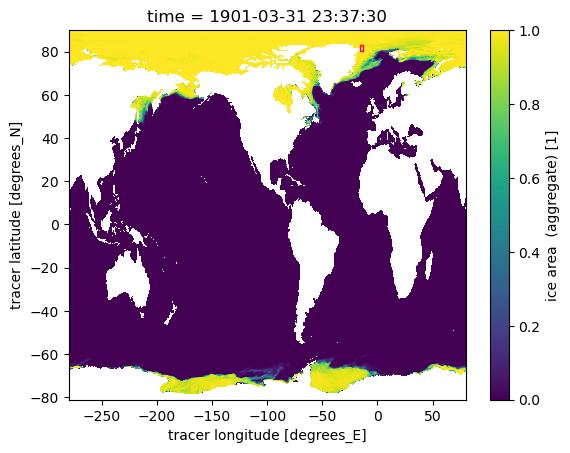

In [52]:
plt.figure()
ax = plt.subplot()

inst_ds.aice_1.isel(time=-1).plot(ax=ax, x = 'geolon_t' , y = 'geolat_t')
# plt.ylim([75,85])
# plt.xlim([-20,-10])

ax.add_patch(plt.Rectangle((-16,80.125),width=3, height=3, color='red', fill=None))
ax.add_patch(plt.Rectangle((-14.8643879243489,81.6865092532964),width=0.1, height=0.1, color='black', fill=None))

plt.show()

In [45]:
times = inst_ds.aice_1.sel(time=slice('1901-03-26','1901-03-26')).time.values

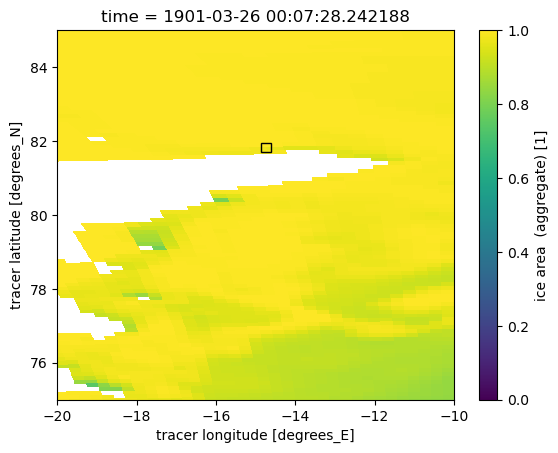

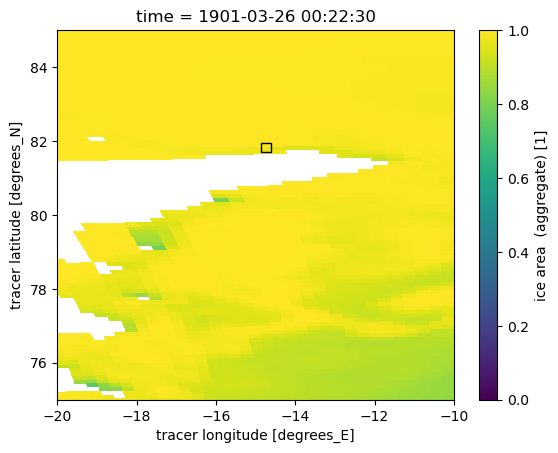

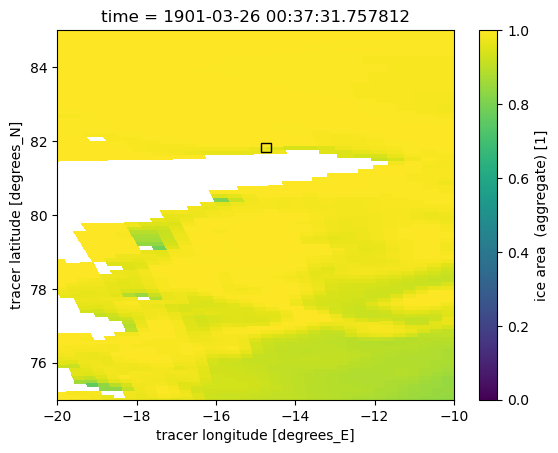

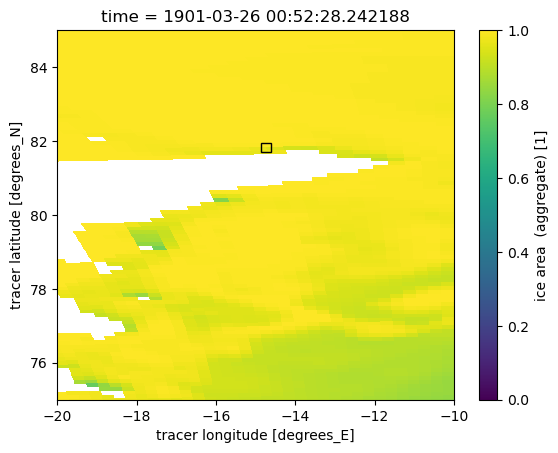

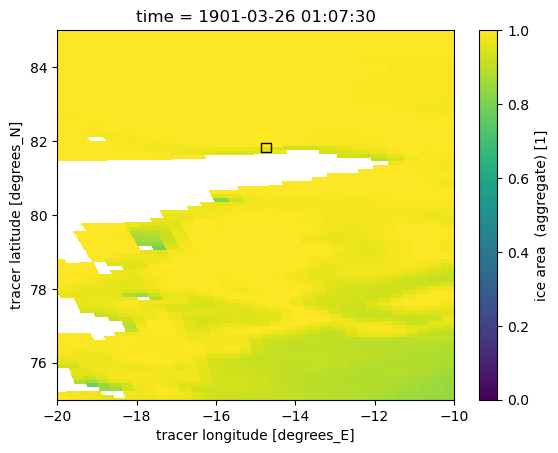

...

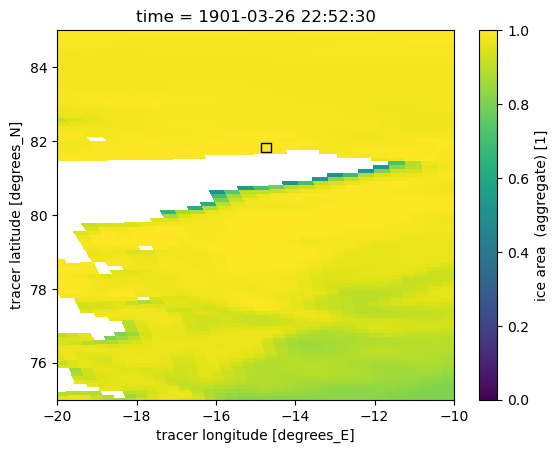

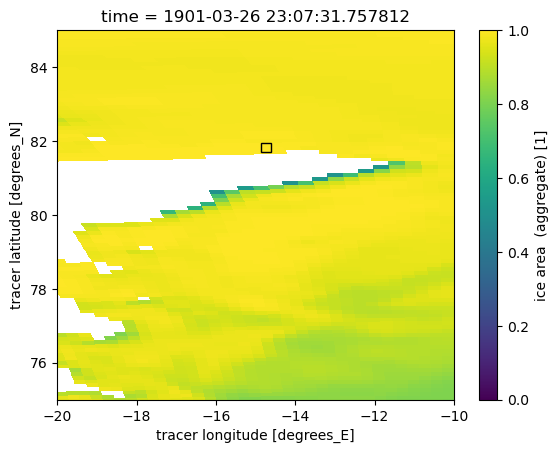

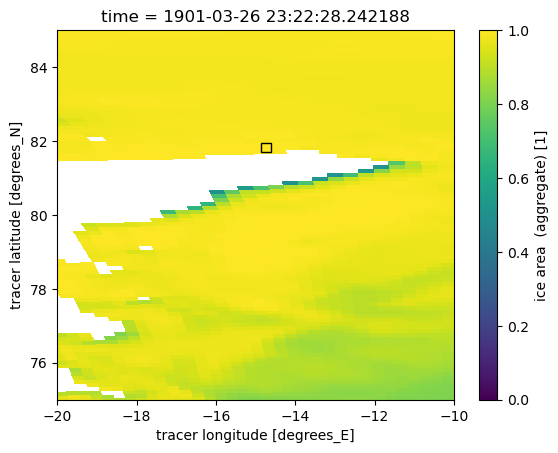

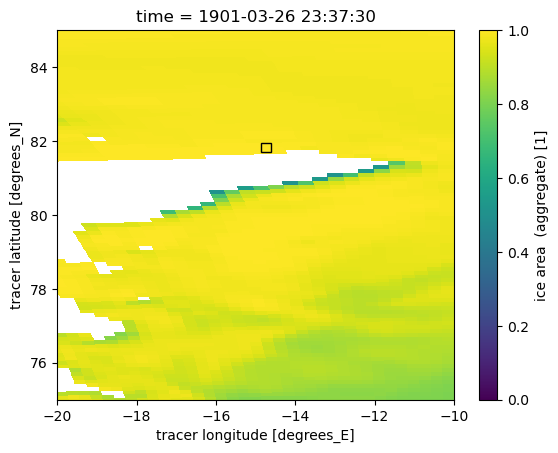

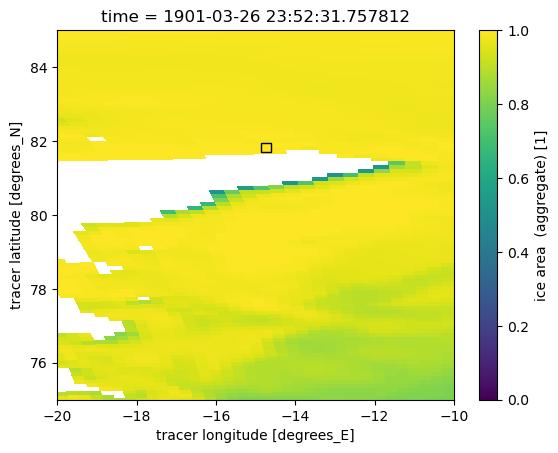

In [48]:
for t in times:
    plt.figure()
    ax = plt.subplot()
    
    inst_ds.aice_1.sel(time=t).plot(ax=ax, x='geolon_t' , y='geolat_t')
    plt.ylim([75,85])
    plt.xlim([-20,-10])
    
    # ax.add_patch(plt.Rectangle((-16,80.125),width=3, height=3, color='black', fill=None))
    ax.add_patch(plt.Rectangle((-14.8643879243489,81.6865092532964),width=0.25, height=0.25, color='black', fill=None))

    plt.show()


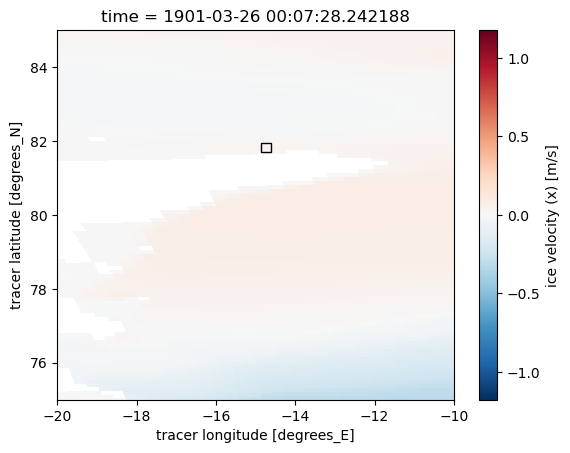

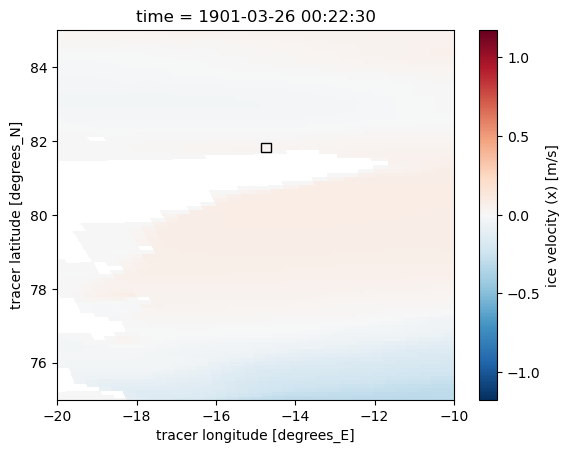

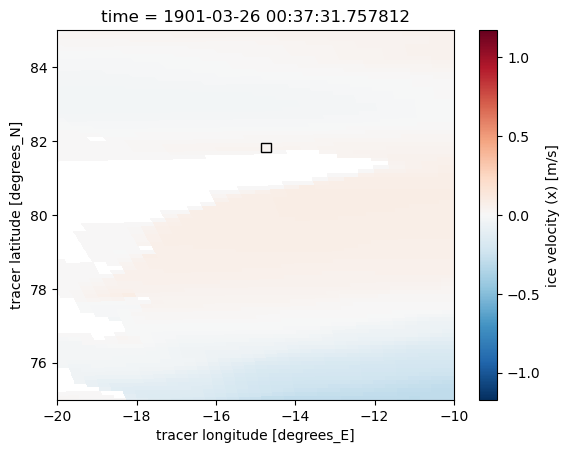

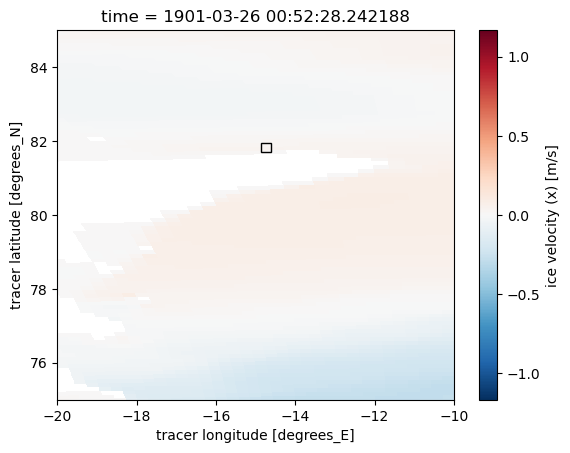

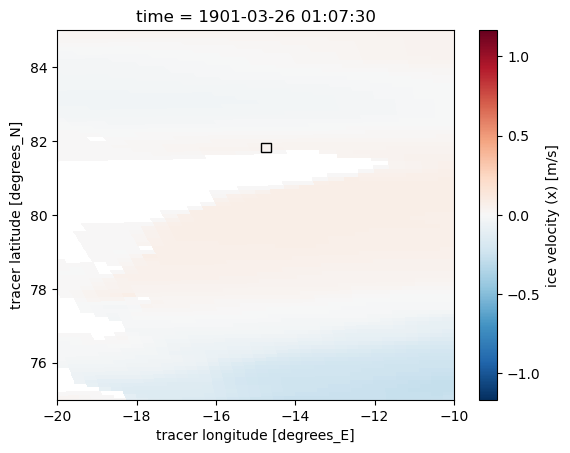

...

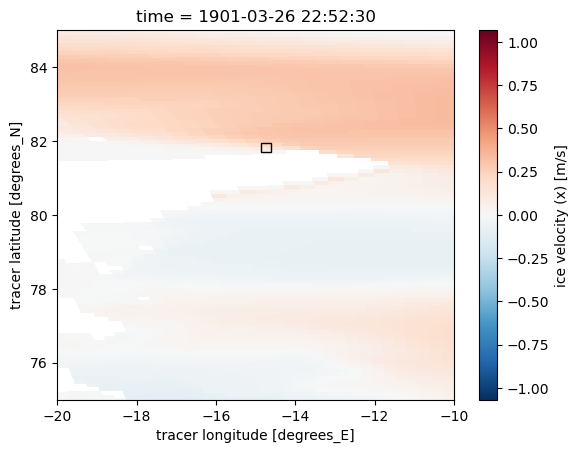

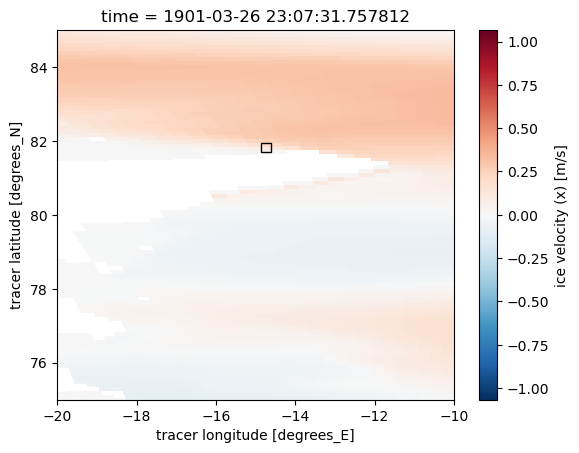

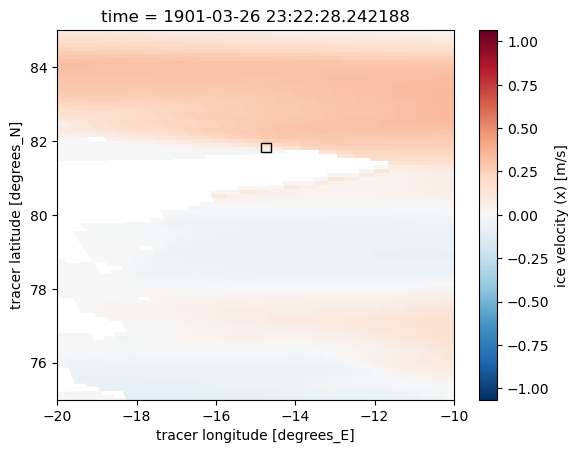

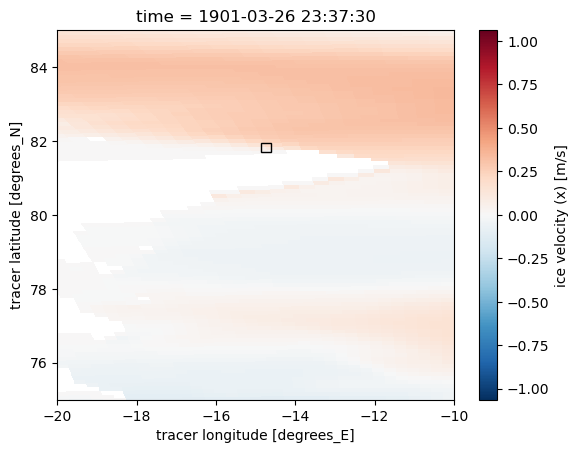

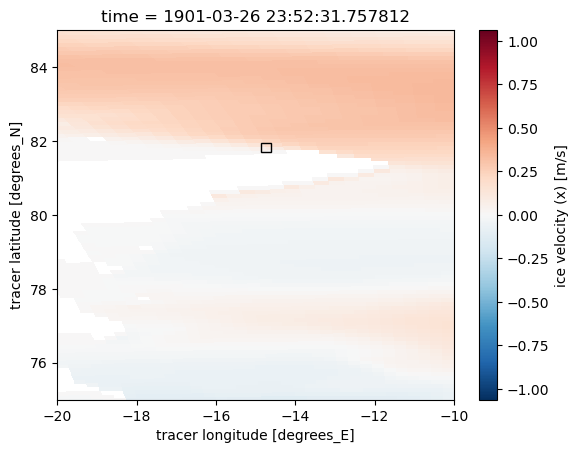

In [49]:
for t in times:
    plt.figure()
    ax = plt.subplot()
    
    inst_ds.uvel_1.sel(time=t).plot(ax=ax, x = 'geolon_t' , y = 'geolat_t')
    plt.ylim([75,85])
    plt.xlim([-20,-10])
    
    # ax.add_patch(plt.Rectangle((-16,80.125),width=3, height=3, color='black', fill=None))
    ax.add_patch(plt.Rectangle((-14.8643879243489,81.6865092532964),width=0.25, height=0.25, color='black', fill=None))

    plt.show()


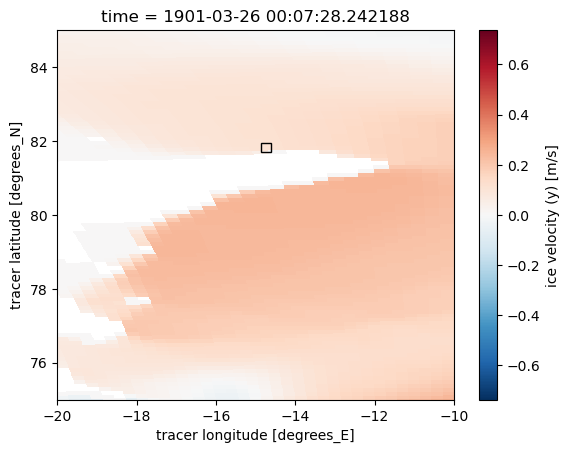

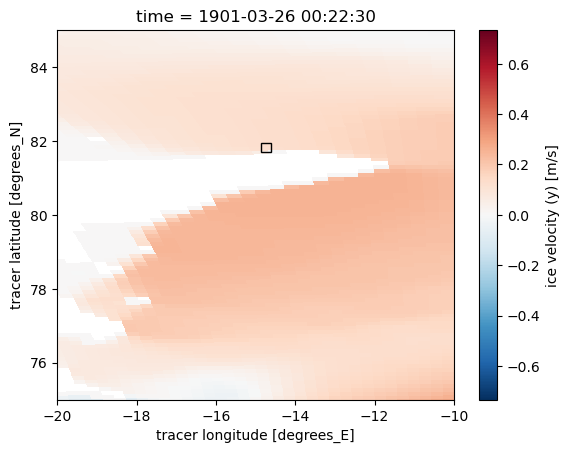

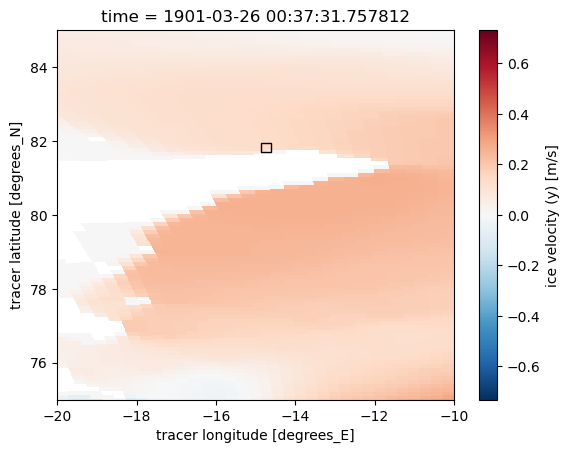

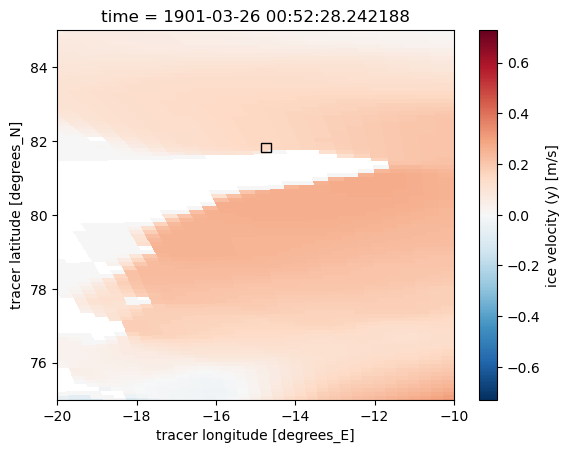

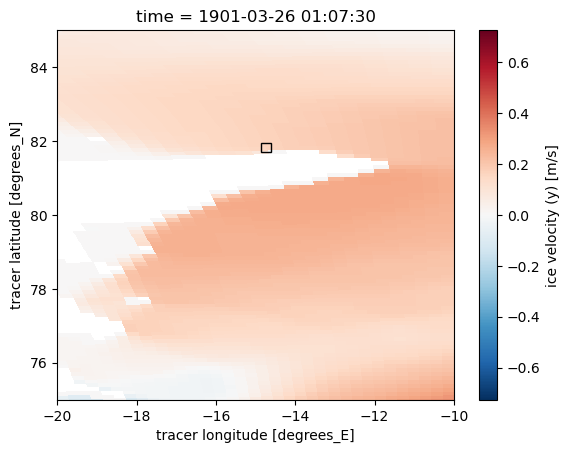

...

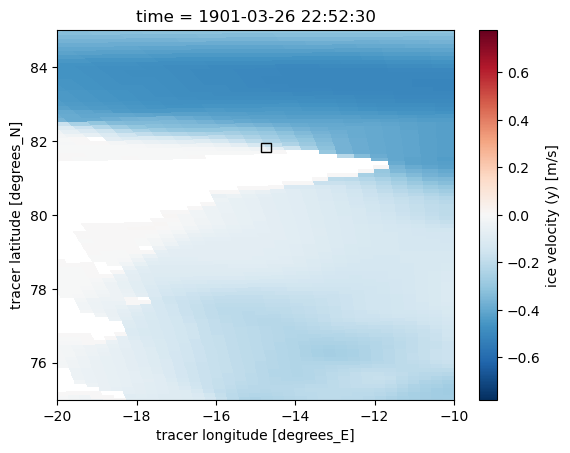

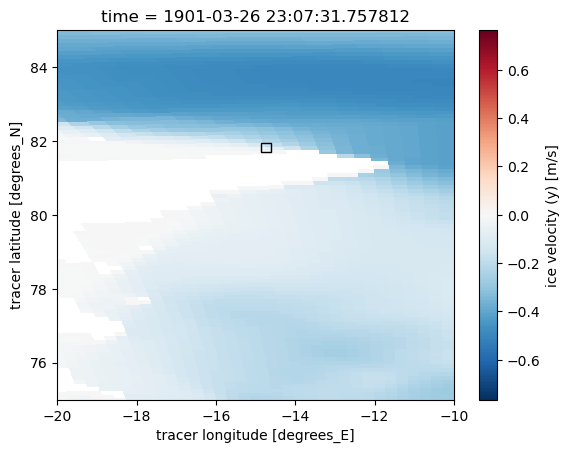

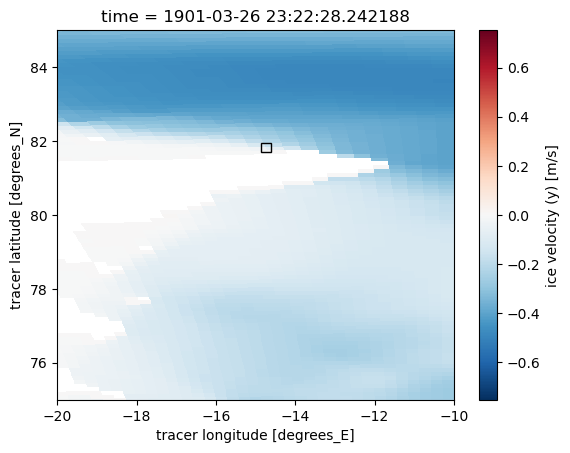

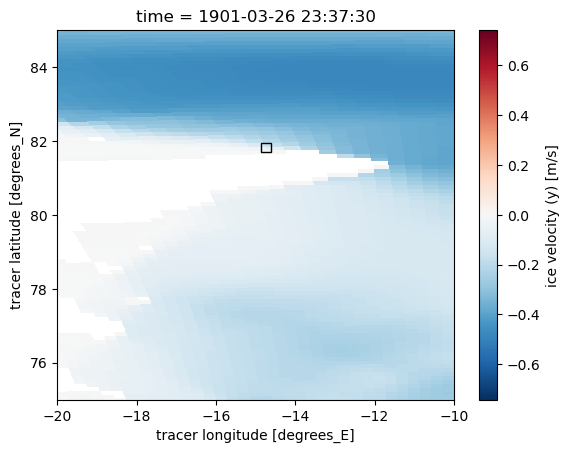

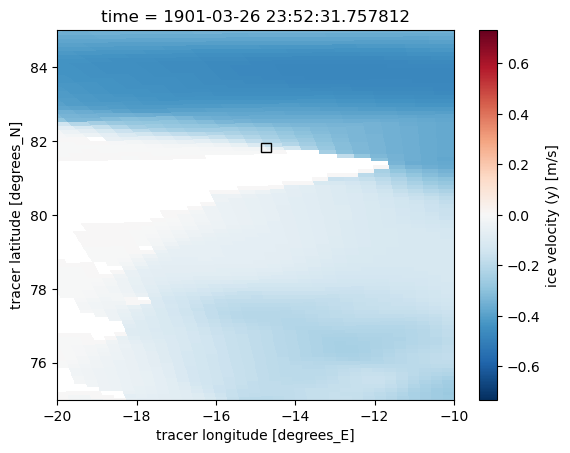

In [50]:
for t in times:
    plt.figure()
    ax = plt.subplot()
    
    inst_ds.vvel_1.sel(time=t).plot(ax=ax, x = 'geolon_t' , y = 'geolat_t')
    plt.ylim([75,85])
    plt.xlim([-20,-10])
    
    # ax.add_patch(plt.Rectangle((-16,80.125),width=3, height=3, color='black', fill=None))
    ax.add_patch(plt.Rectangle((-14.8643879243489,81.6865092532964),width=0.25, height=0.25, color='black', fill=None))

    plt.show()
